# CNN and MLP clustering analysis using correlation-based representations

This uses a sign-alignment algorithm from https://arxiv.org/pdf/1810.01588.pdf

In [1]:
import sys
sys.path.append('..')
import numpy as np
import warnings
import matplotlib.pyplot as plt
from src.visualization import cluster_and_visualize
from src.experiment_tagging import get_model_path
from src.utils import suppress, all_logging_disabled

Using TensorFlow backend.


MNIST+DROPOUT, is_unpruned=True
submodule layers: [0, 0, 0, 0, 0, 0, 0, 2, 3]
submodule sizes: [19, 50, 21, 25, 24, 18, 90, 45, 25]


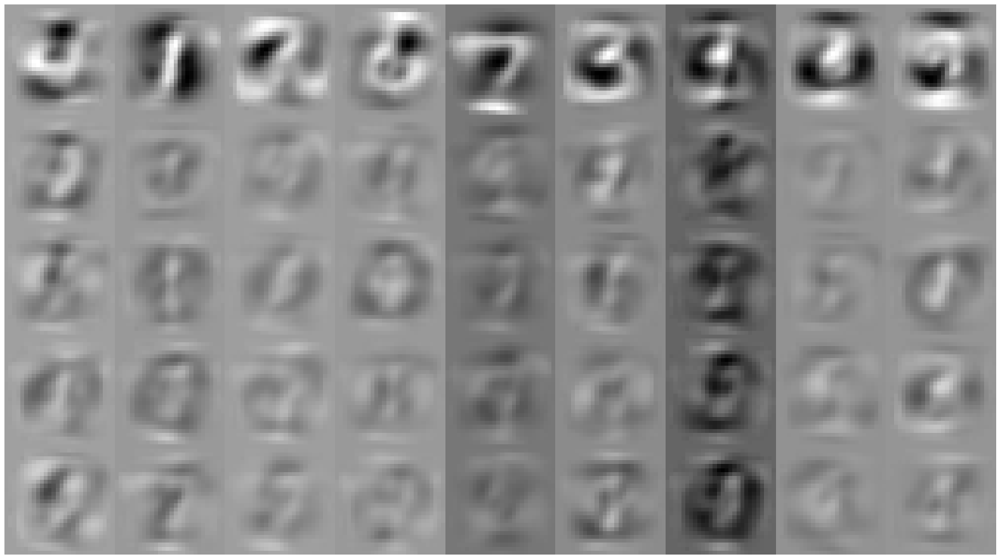


MNIST+DROPOUT, is_unpruned=False
submodule layers: [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3]
submodule sizes: [25, 28, 33, 39, 42, 79, 14, 40, 19, 12, 6, 112, 52, 40, 68, 127, 19, 56, 80, 88, 32]


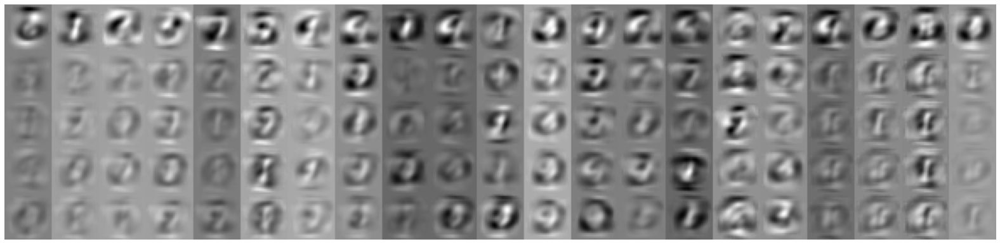

MNIST+L1REG, is_unpruned=True
submodule layers: [0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 3, 3, 3]
submodule sizes: [83, 8, 16, 5, 8, 68, 12, 6, 4, 137, 13, 120, 14, 42]


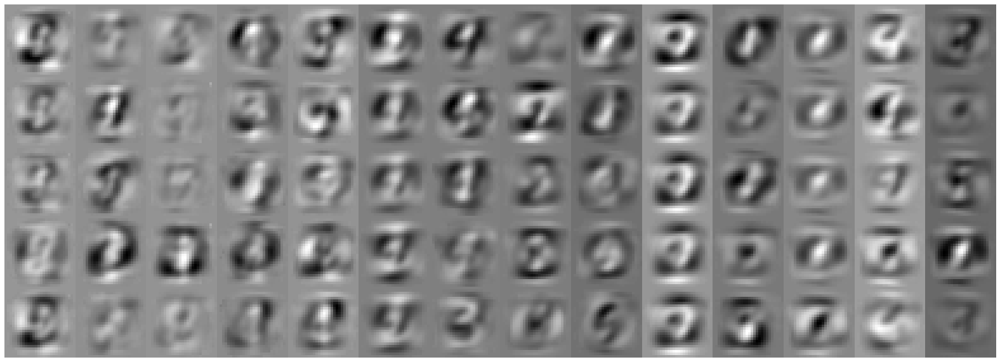


MNIST+L1REG, is_unpruned=False
submodule layers: [0, 0, 1, 1, 2, 2, 3, 3]
submodule sizes: [15, 15, 10, 14, 9, 7, 11, 16]


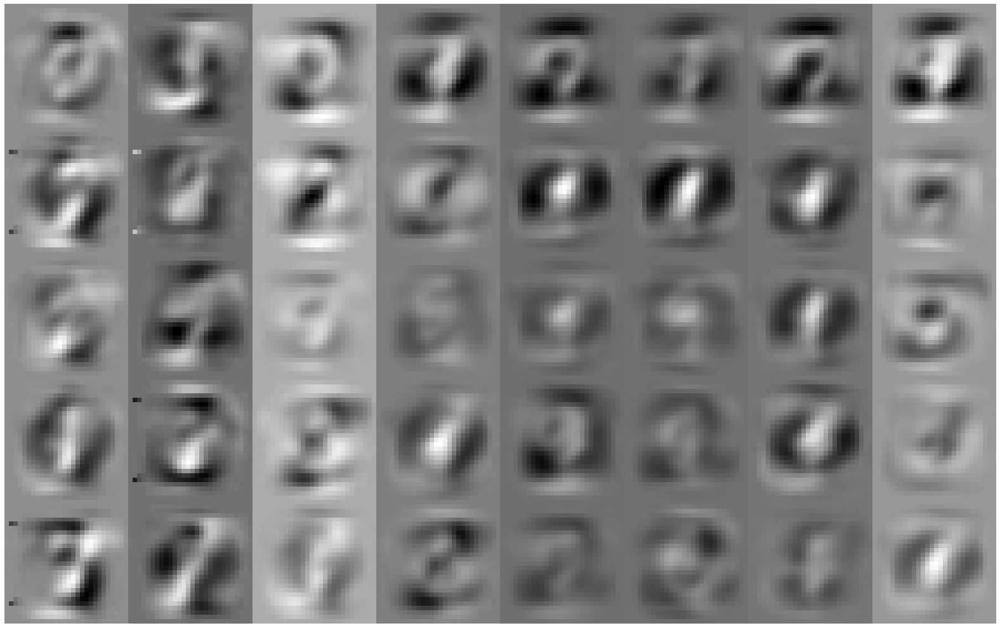

HALVES-MNIST+DROPOUT, is_unpruned=True
submodule layers: [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3]
submodule sizes: [19, 28, 18, 17, 17, 94, 35, 38, 35, 11, 43, 69, 60, 35, 45, 47, 48, 78, 31, 39, 59]


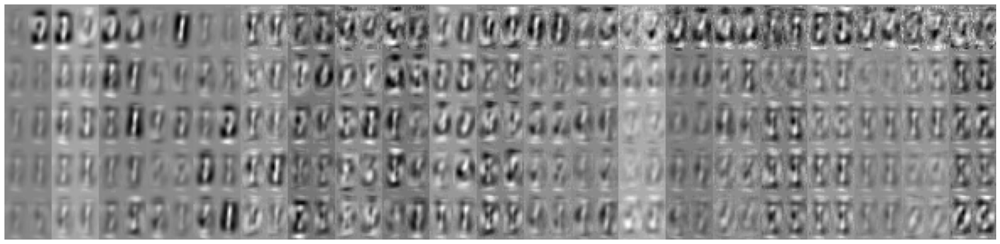


HALVES-MNIST+DROPOUT, is_unpruned=False
submodule layers: [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3]
submodule sizes: [68, 60, 29, 50, 18, 21, 37, 12, 26, 20, 14, 29, 35, 29, 39, 25, 36, 20, 33, 39, 32, 24, 46, 33, 38, 25, 19, 39]


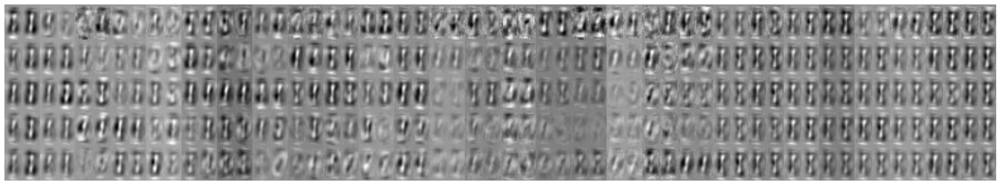

HALVES-MNIST+L1REG, is_unpruned=True
submodule layers: [0, 1, 2, 2, 2, 2, 2, 2]
submodule sizes: [168, 104, 11, 16, 20, 17, 19, 16]


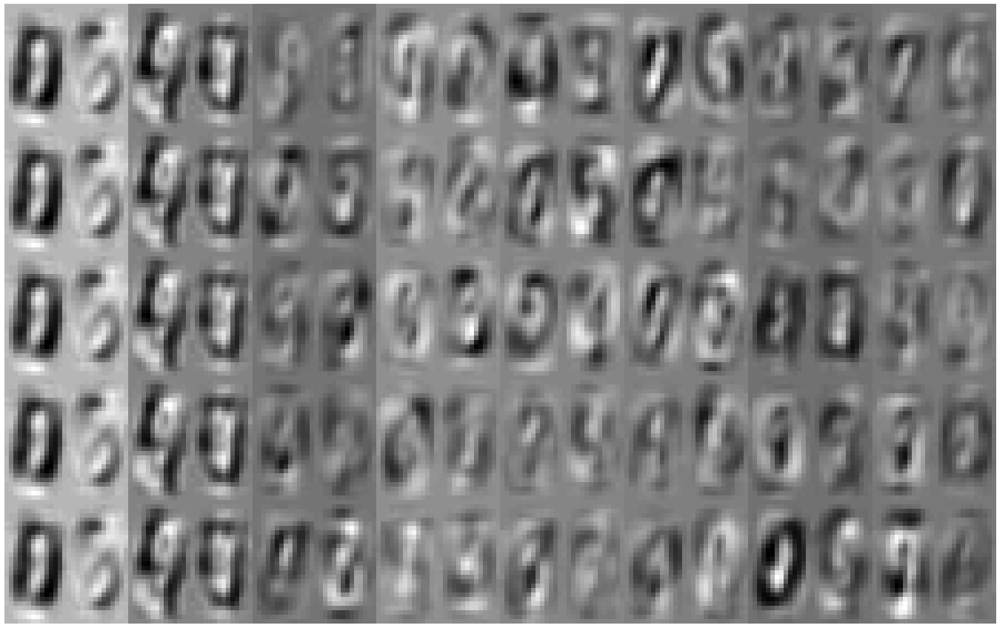


HALVES-MNIST+L1REG, is_unpruned=False
submodule layers: [0, 1, 1, 2, 2, 2, 2, 2, 2, 2]
submodule sizes: [127, 11, 93, 21, 5, 10, 4, 9, 13, 12]


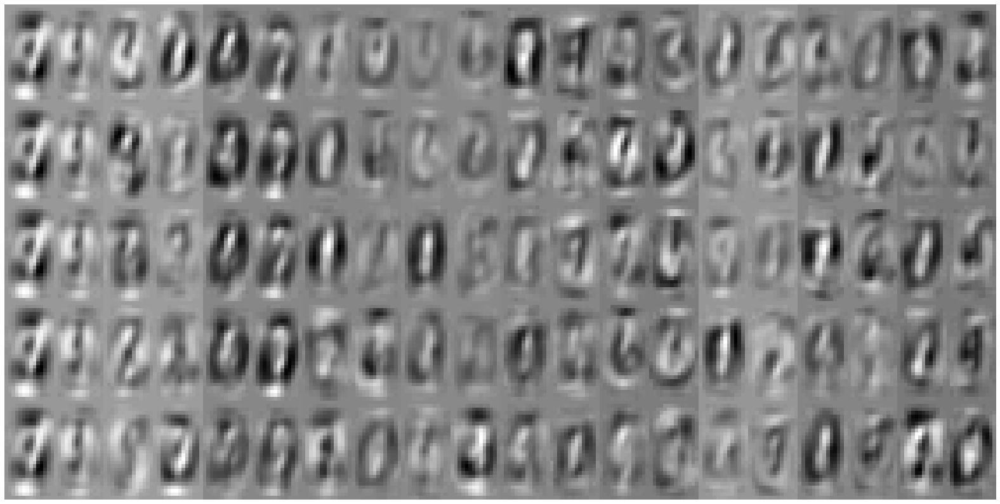

HALVES-SAME-MNIST+DROPOUT, is_unpruned=True
submodule layers: [0, 0, 0, 0, 0, 0, 0, 2, 3]
submodule sizes: [34, 26, 40, 30, 27, 59, 16, 11, 18]


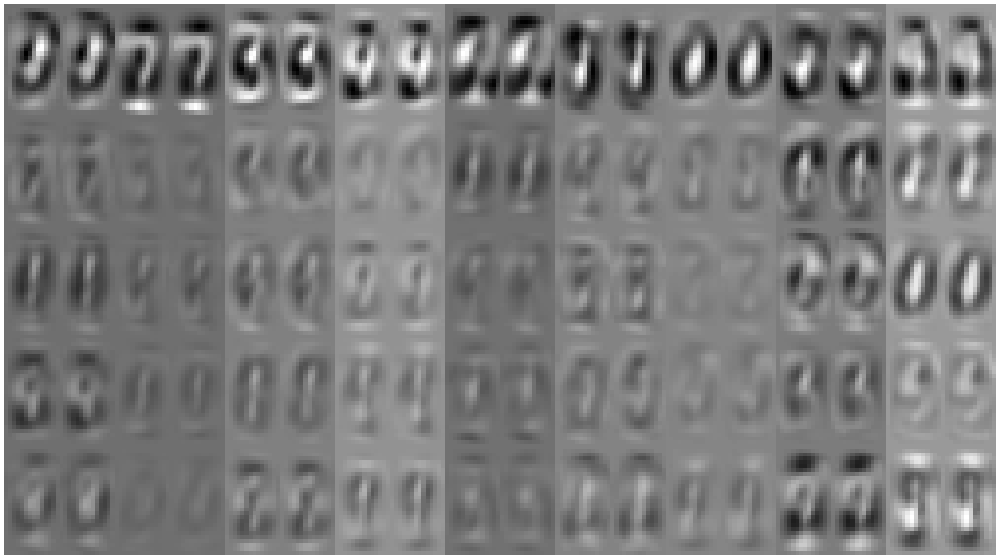


HALVES-SAME-MNIST+DROPOUT, is_unpruned=False
submodule layers: [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 3, 3, 3]
submodule sizes: [47, 82, 38, 14, 13, 22, 14, 73, 4, 160, 12, 93, 138, 25, 94, 104, 58]


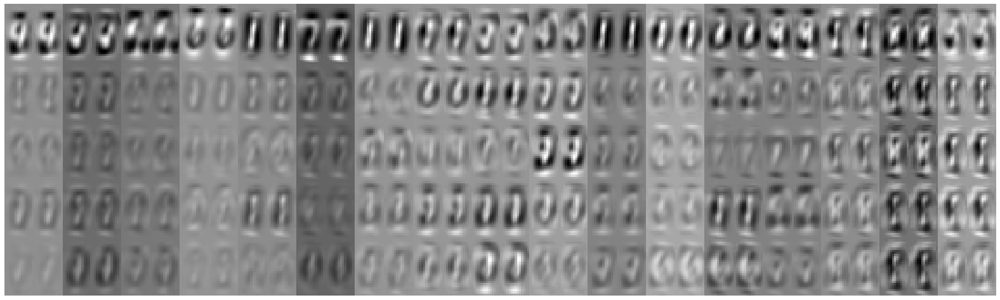

HALVES-SAME-MNIST+L1REG, is_unpruned=True
submodule layers: [0, 0, 1, 1, 1, 1, 1, 2, 2, 3, 3, 3]
submodule sizes: [99, 11, 10, 94, 6, 6, 11, 141, 8, 5, 97, 46]


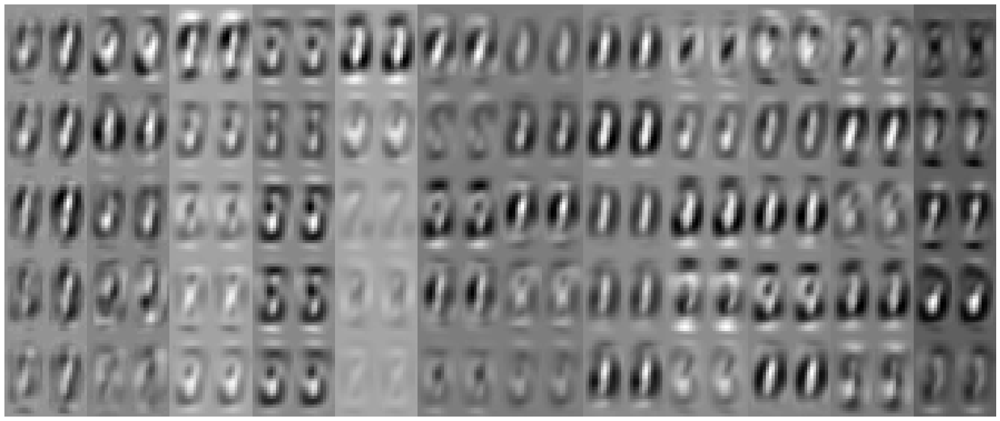


HALVES-SAME-MNIST+L1REG, is_unpruned=False
submodule layers: [0, 0, 1, 1, 2, 2, 2, 3, 3]
submodule sizes: [9, 4, 10, 10, 6, 21, 7, 11, 13]


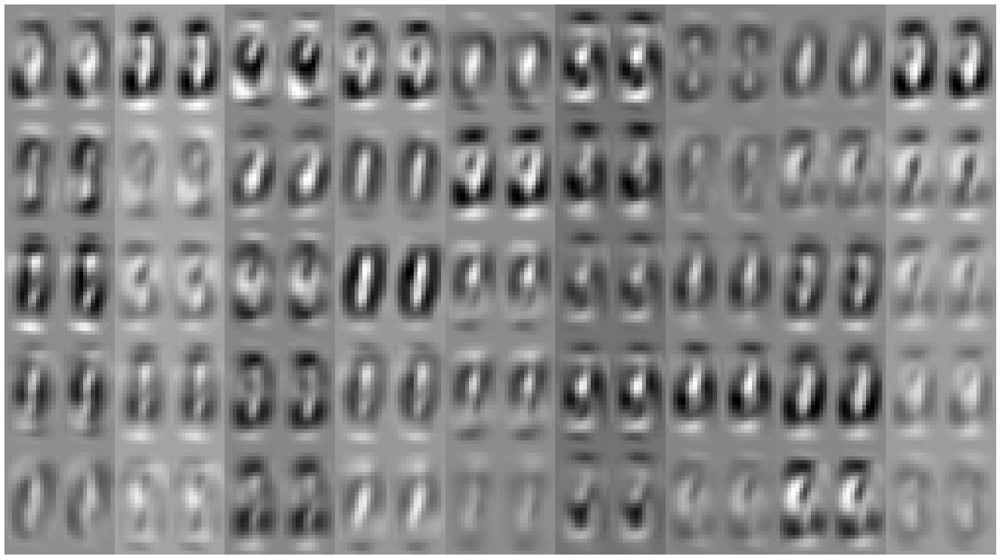

MNIST+MOD-INIT, is_unpruned=True
submodule layers: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3]
submodule sizes: [48, 20, 31, 13, 19, 22, 40, 18, 17, 28, 32, 21, 25, 33, 19, 26, 36, 32, 25, 20, 30, 31, 45, 26, 24, 27, 21, 22]


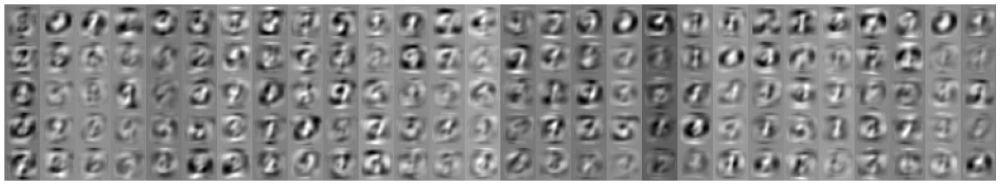


MNIST+MOD-INIT, is_unpruned=False
submodule layers: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3]
submodule sizes: [39, 19, 15, 31, 20, 17, 24, 20, 29, 42, 16, 33, 21, 21, 36, 32, 19, 26, 25, 27, 22, 19, 25, 31, 27, 21, 28, 31, 24, 25]


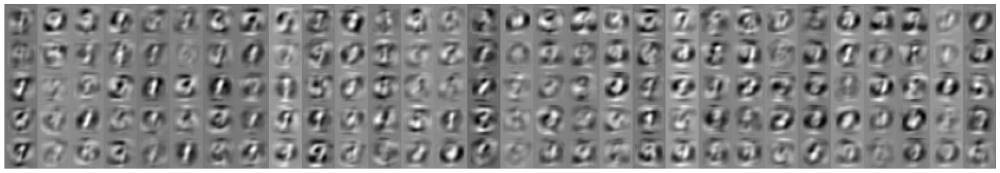

MNIST+MOD-INIT+DROPOUT, is_unpruned=True
submodule layers: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3]
submodule sizes: [25, 23, 29, 15, 29, 22, 17, 32, 31, 33, 24, 43, 24, 26, 37, 25, 22, 34, 17, 27, 45, 30, 22, 40, 23, 16, 19, 22]


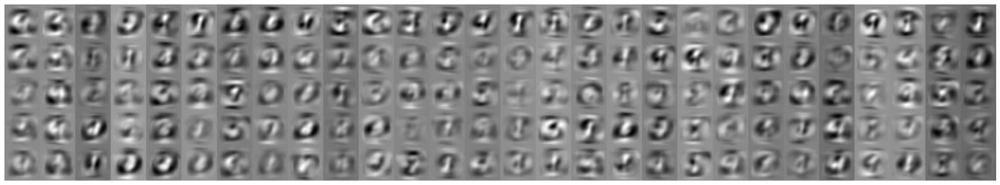


MNIST+MOD-INIT+DROPOUT, is_unpruned=False
submodule layers: [0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3]
submodule sizes: [67, 136, 5, 13, 28, 25, 14, 17, 56, 24, 18, 31, 30, 19, 25, 25, 68, 38, 24, 34, 22, 24, 23, 21, 74, 46, 27, 22, 17]


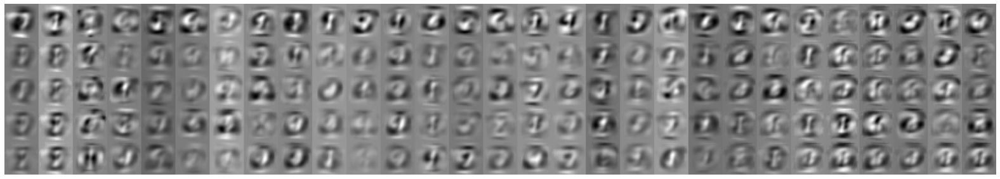

MNIST+MOD-INIT+L1REG, is_unpruned=True
submodule layers: [0, 0, 1, 1, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3]
submodule sizes: [56, 41, 33, 67, 88, 5, 7, 9, 6, 96, 5, 7, 5, 9, 6, 21, 6]


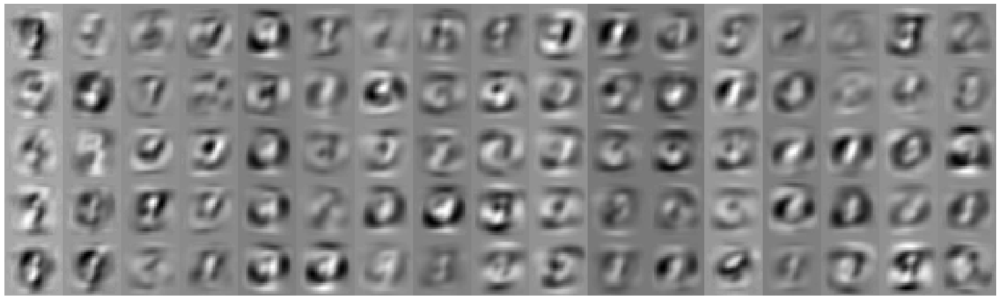


MNIST+MOD-INIT+L1REG, is_unpruned=False
submodule layers: [0, 1, 2, 2, 3, 3, 3, 3, 3]
submodule sizes: [35, 18, 8, 4, 13, 6, 10, 4, 5]


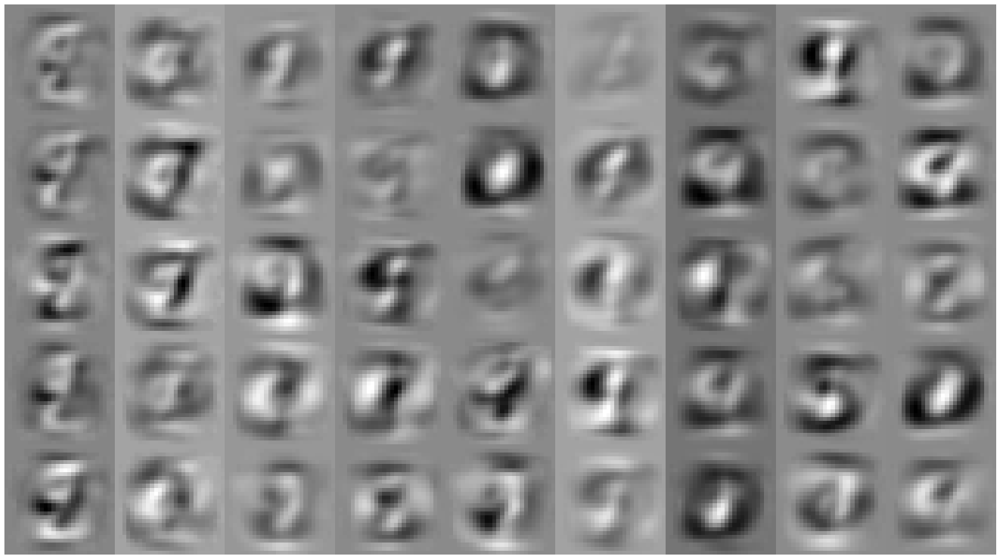

FASHION+DROPOUT, is_unpruned=True
submodule layers: [0, 0, 0, 0, 0, 0, 1, 1, 2, 2, 3, 3, 3, 3]
submodule sizes: [21, 56, 39, 22, 24, 23, 20, 5, 172, 84, 67, 5, 28, 156]


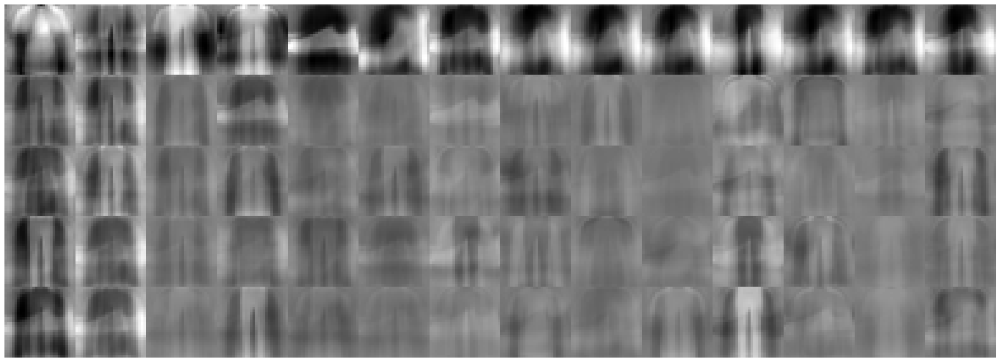


FASHION+DROPOUT, is_unpruned=False
submodule layers: [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 3]
submodule sizes: [39, 33, 29, 59, 21, 11, 16, 11, 8, 18, 83, 29, 79, 49, 28, 96, 81, 49, 35, 86, 60, 26]


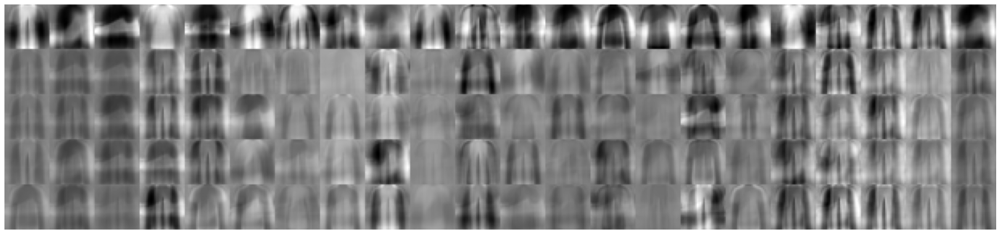

FASHION+L1REG, is_unpruned=True
submodule layers: [0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 3, 3, 3]
submodule sizes: [6, 71, 4, 52, 6, 4, 4, 4, 7, 11, 10, 81, 12, 70, 4, 42]


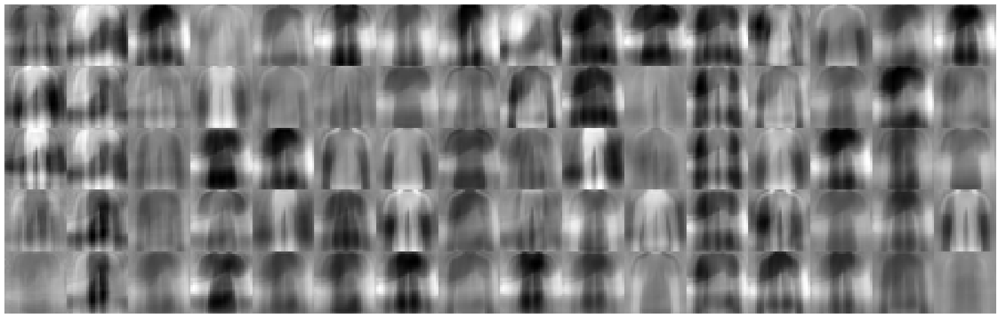


FASHION+L1REG, is_unpruned=False
submodule layers: [0, 1, 1, 1, 1, 1, 2, 3, 3, 3, 3, 3]
submodule sizes: [6, 6, 4, 6, 4, 4, 4, 5, 7, 9, 4, 4]


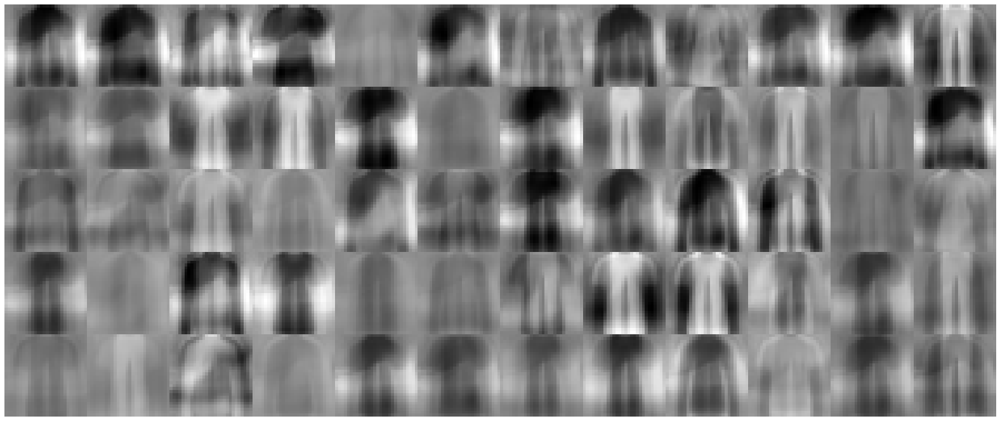

CIFAR10+DROPOUT, is_unpruned=True
submodule layers: [0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3]
submodule sizes: [17, 5, 4, 36, 10, 24, 8, 122, 32, 19, 36, 134, 49, 37, 31, 81]


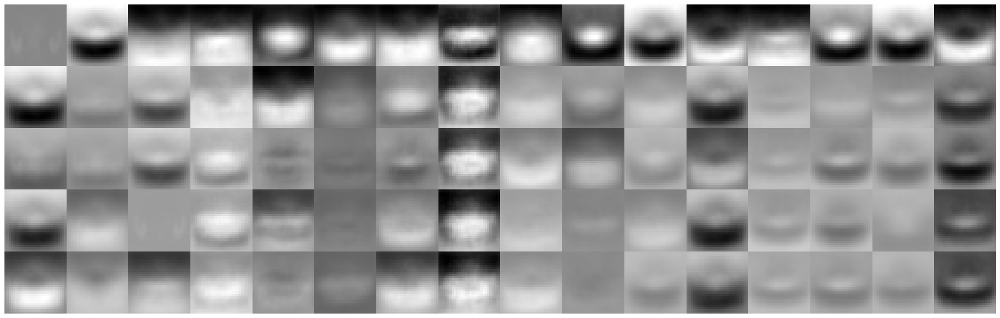


CIFAR10+DROPOUT, is_unpruned=False
submodule layers: [0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3]
submodule sizes: [12, 50, 47, 7, 4, 14, 20, 4, 31, 50, 52, 43, 31, 39, 33, 53, 62, 34, 9, 25, 33]


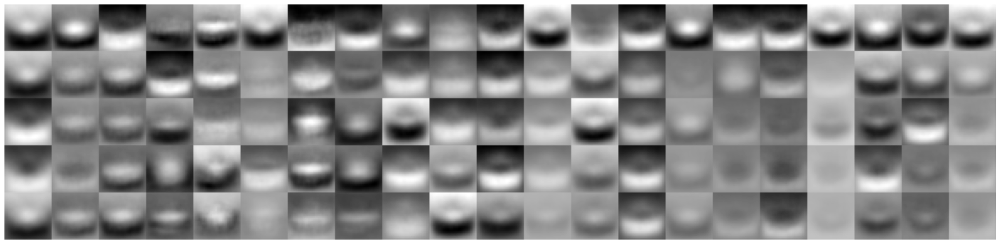

CIFAR10+L1REG, is_unpruned=True
submodule layers: [0, 1, 1, 1, 1, 1, 2, 2, 3, 3]
submodule sizes: [21, 19, 6, 9, 4, 13, 33, 12, 42, 46]


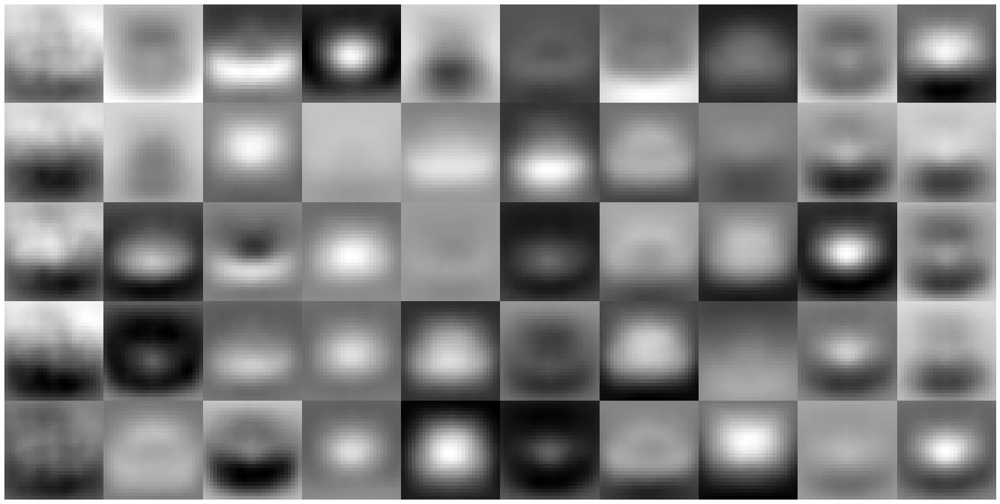


CIFAR10+L1REG, is_unpruned=False
submodule layers: [1, 2, 3]
submodule sizes: [19, 8, 30]


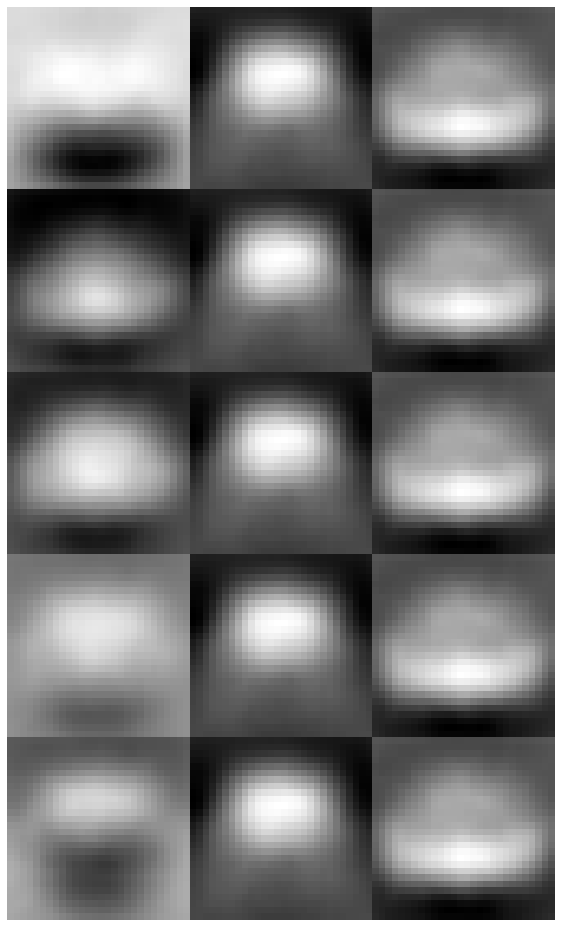

CNN-MNIST+DROPOUT, is_unpruned=True
submodule layers: [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2]
submodule sizes: [4, 4, 6, 6, 8, 6, 9, 10, 5, 4, 9, 7, 10, 9, 7, 4, 6, 4, 11, 12, 13, 10, 10]


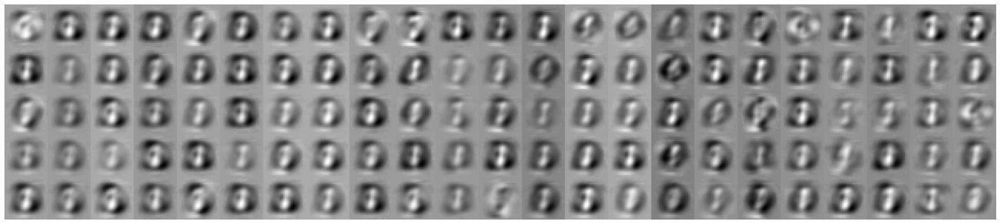


CNN-MNIST+DROPOUT, is_unpruned=False
submodule layers: [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2]
submodule sizes: [8, 4, 6, 4, 6, 6, 4, 10, 9, 7, 10, 10, 12, 4, 12, 10, 7, 12, 9, 12]


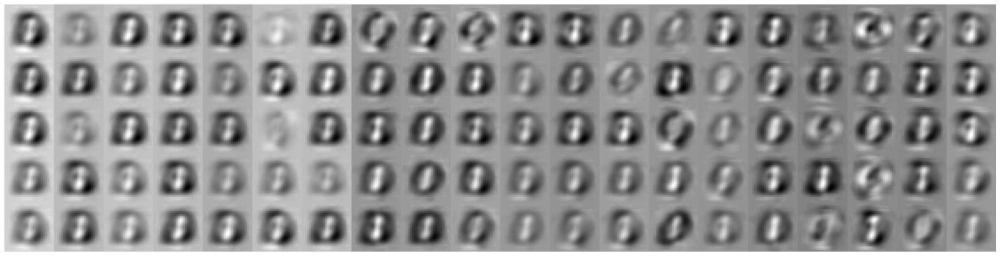

CNN-MNIST+L1REG, is_unpruned=True
submodule layers: [0, 1, 1, 1, 1, 2]
submodule sizes: [6, 4, 5, 5, 5, 8]


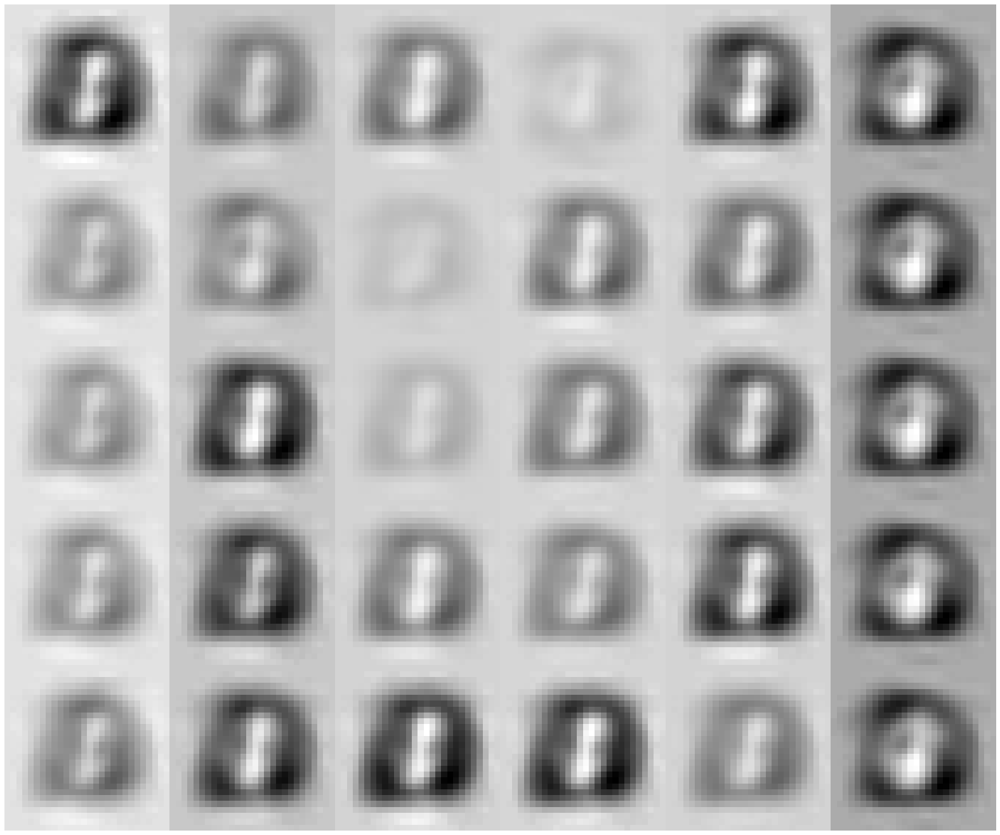


CNN-MNIST+L1REG, is_unpruned=False
submodule layers: [0, 1, 2]
submodule sizes: [5, 17, 8]


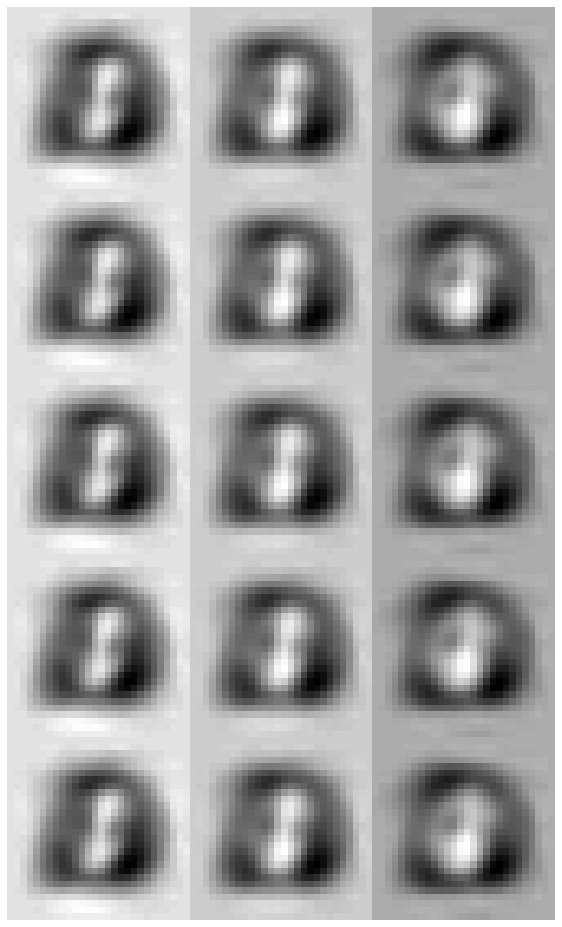

CNN-STACKED-SAME-MNIST+DROPOUT, is_unpruned=True
submodule layers: [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2]
submodule sizes: [7, 8, 7, 8, 7, 7, 9, 5, 9, 7, 4, 7, 6, 5, 11, 5, 7, 11, 7, 6, 7, 7, 7, 10]


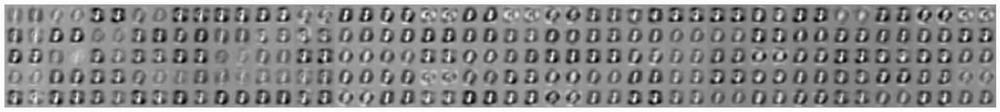


CNN-STACKED-SAME-MNIST+DROPOUT, is_unpruned=False
submodule layers: [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2]
submodule sizes: [7, 5, 14, 9, 6, 8, 10, 17, 7, 12, 4, 5, 13, 6, 12, 10, 13, 6]


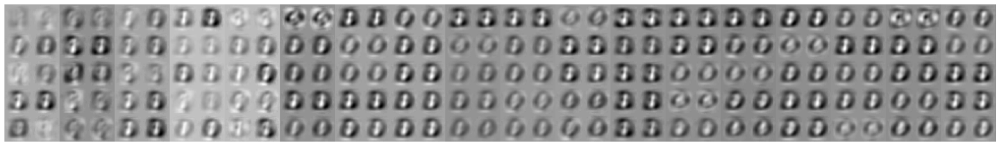

CNN-STACKED-SAME-MNIST+L1REG, is_unpruned=True
submodule layers: [0, 0, 1, 2]
submodule sizes: [6, 5, 8, 8]


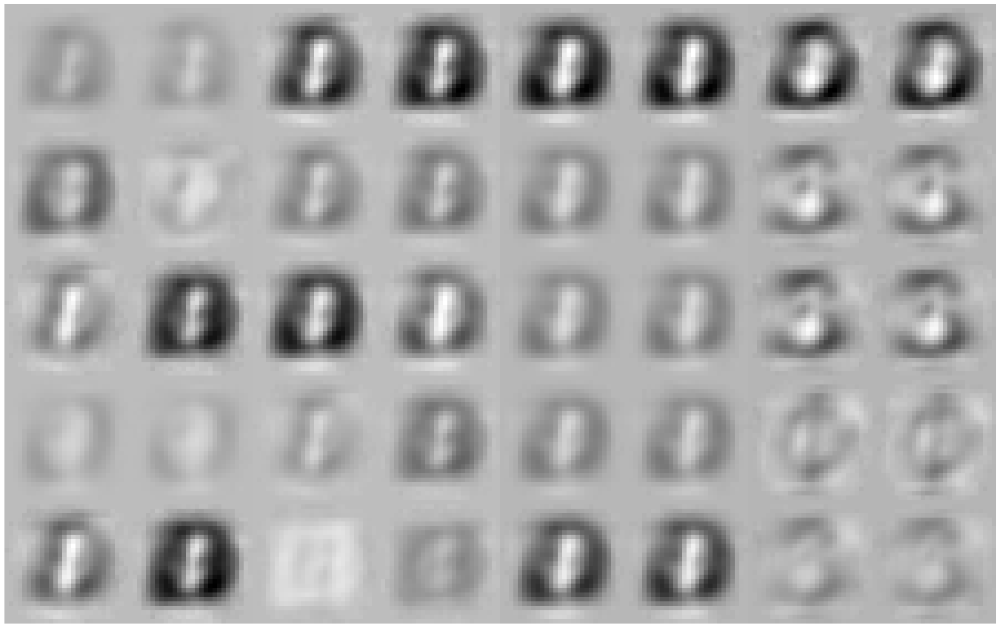


CNN-STACKED-SAME-MNIST+L1REG, is_unpruned=False
submodule layers: [2]
submodule sizes: [8]


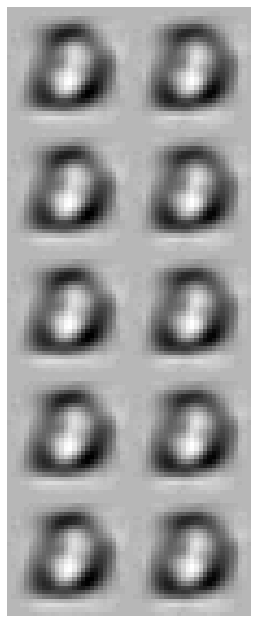

CNN-STACKED-MNIST+DROPOUT, is_unpruned=True
submodule layers: [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2]
submodule sizes: [4, 10, 4, 10, 12, 5, 6, 10, 7, 5, 4, 8, 5, 8, 4, 7, 4, 7, 15, 9, 8, 10, 6, 5]


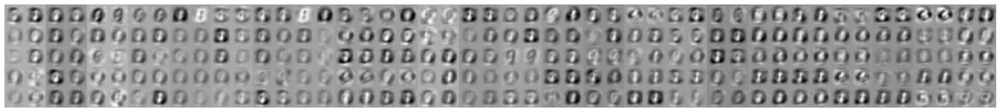


CNN-STACKED-MNIST+DROPOUT, is_unpruned=False
submodule layers: [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2]
submodule sizes: [5, 9, 10, 9, 7, 7, 6, 11, 12, 8, 5, 6, 14, 10, 10, 10, 4]


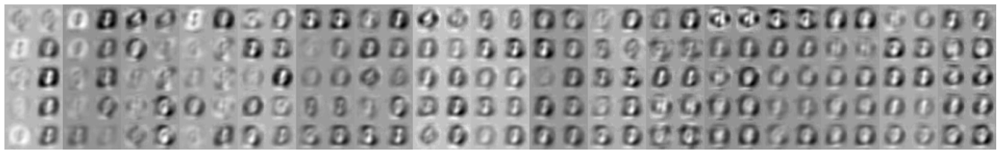

CNN-STACKED-MNIST+L1REG, is_unpruned=True
submodule layers: [0, 1]
submodule sizes: [4, 4]


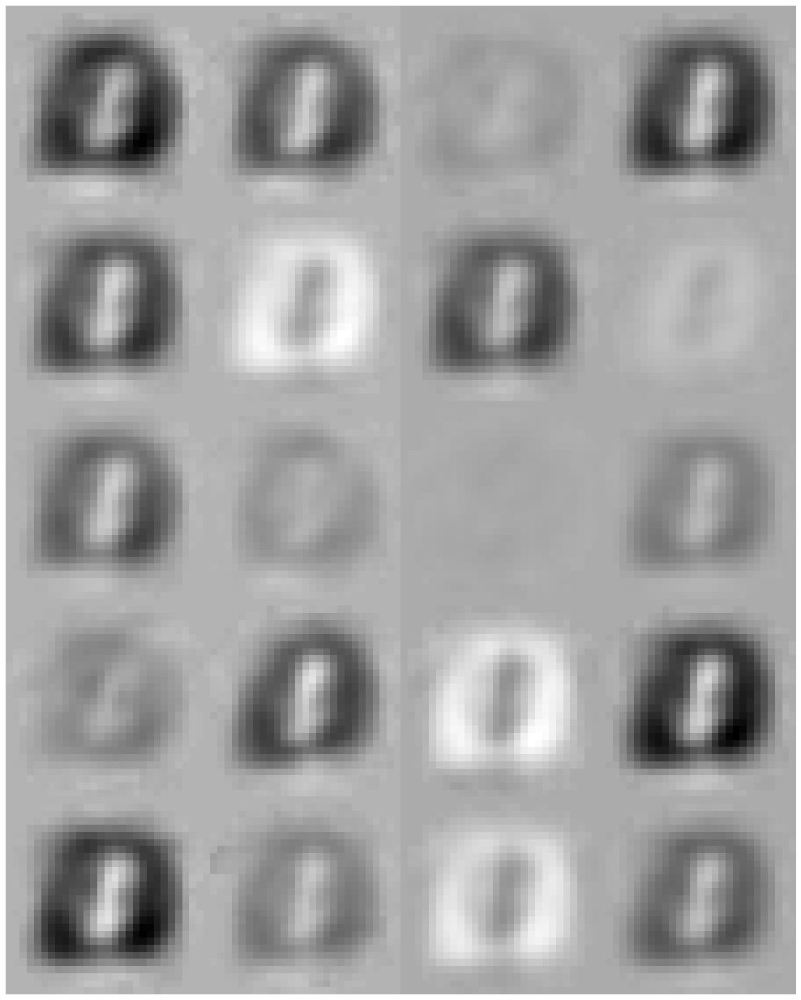


CNN-STACKED-MNIST+L1REG, is_unpruned=False
submodule layers: [0, 1, 1]
submodule sizes: [5, 4, 5]


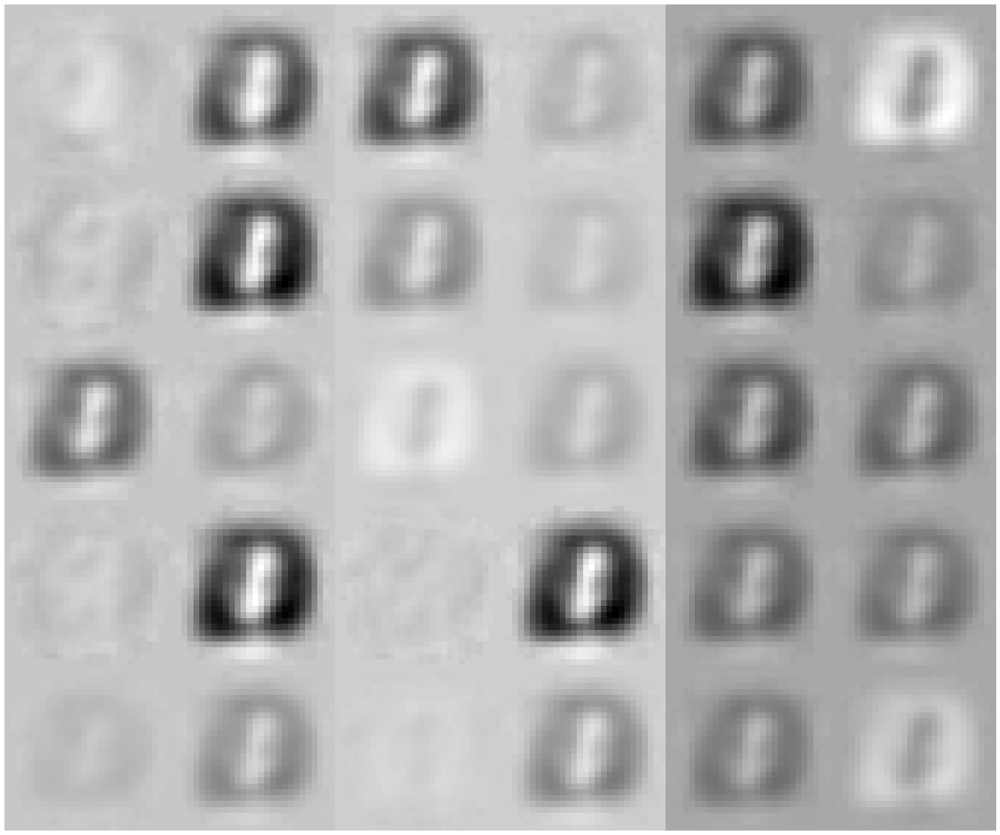

CNN-MNIST+MOD-INIT, is_unpruned=True
submodule layers: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2]
submodule sizes: [5, 5, 4, 6, 4, 5, 6, 7, 6, 14, 7, 4, 6, 4, 6, 4, 9, 9, 9, 5, 6, 11, 12, 4, 5, 5, 9, 4]


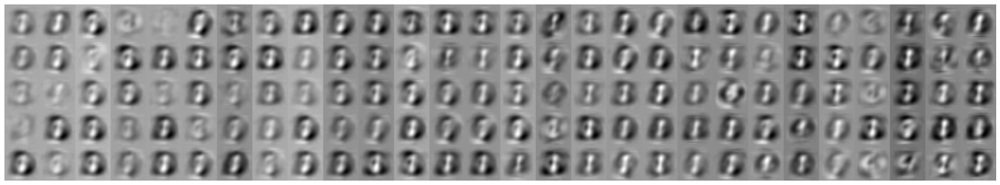


CNN-MNIST+MOD-INIT, is_unpruned=False
submodule layers: [0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 2]
submodule sizes: [14, 17, 6, 22, 23, 5, 6, 35, 13, 4, 4]


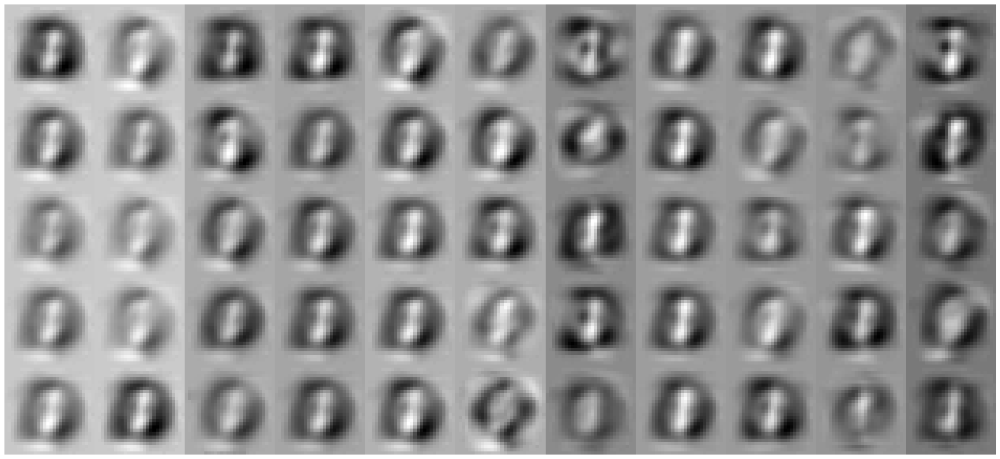

CNN-MNIST+MOD-INIT+DROPOUT, is_unpruned=True
submodule layers: [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2]
submodule sizes: [8, 5, 5, 6, 6, 8, 9, 9, 11, 6, 5, 6, 7, 7, 7, 4, 5, 6, 13, 7, 5, 10, 7, 6, 5, 6]


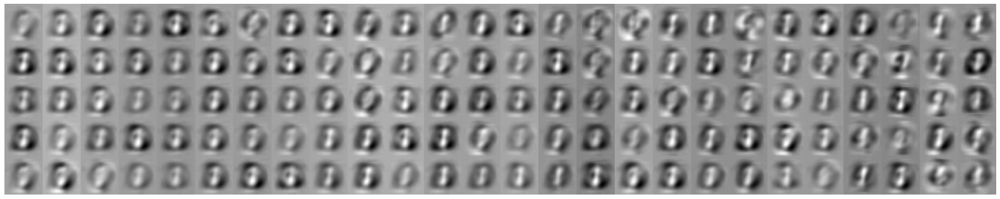


CNN-MNIST+MOD-INIT+DROPOUT, is_unpruned=False
submodule layers: [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2]
submodule sizes: [5, 5, 6, 9, 5, 13, 12, 9, 10, 11, 8, 10, 15, 11, 11, 7, 9]


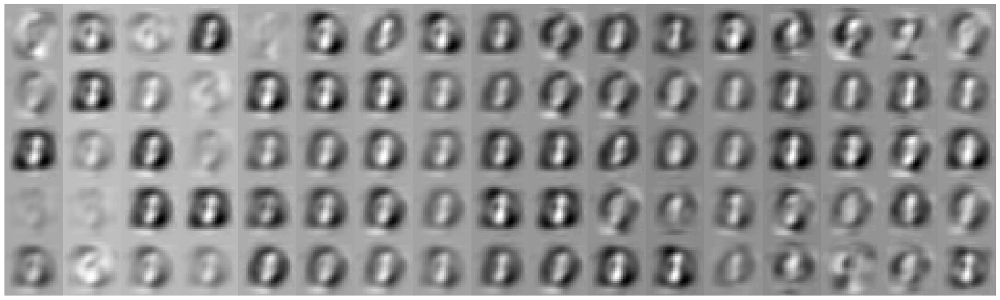

CNN-MNIST+MOD-INIT+L1REG, is_unpruned=True
submodule layers: [0, 1, 1, 2]
submodule sizes: [6, 6, 7, 8]


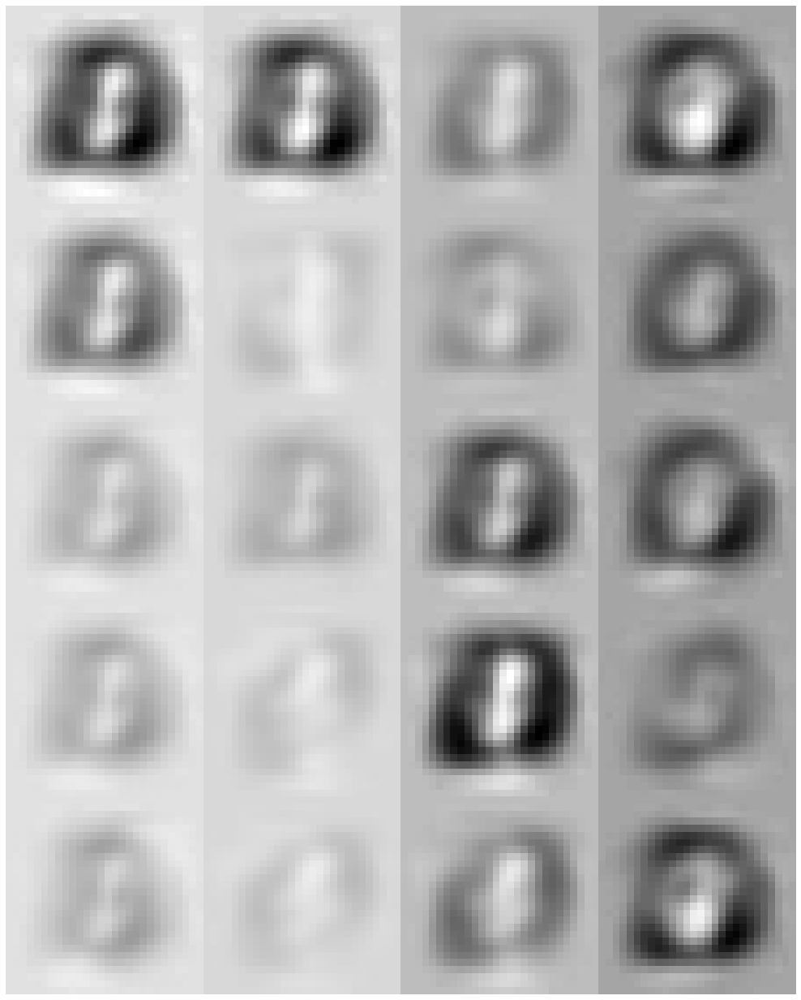


CNN-MNIST+MOD-INIT+L1REG, is_unpruned=False
submodule layers: [1, 2]
submodule sizes: [6, 8]


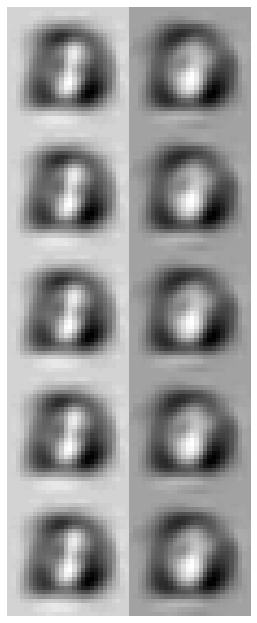

CNN-FASHION+DROPOUT, is_unpruned=True
submodule layers: [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2]
submodule sizes: [6, 11, 4, 7, 8, 10, 5, 8, 10, 7, 5, 6, 8, 4, 5, 5, 7, 4, 14, 15, 10, 11, 4, 5]


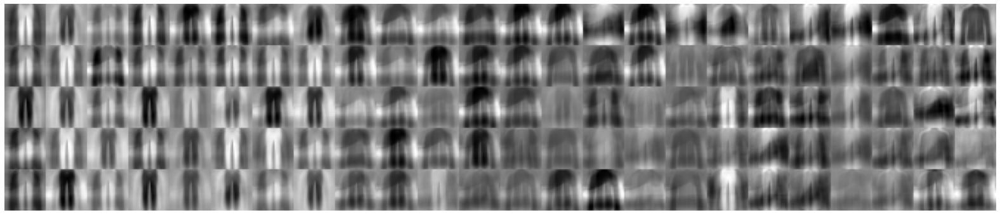


CNN-FASHION+DROPOUT, is_unpruned=False
submodule layers: [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2]
submodule sizes: [6, 7, 4, 6, 5, 6, 7, 7, 13, 5, 9, 6, 8, 11, 7, 4, 15, 7, 5, 6]


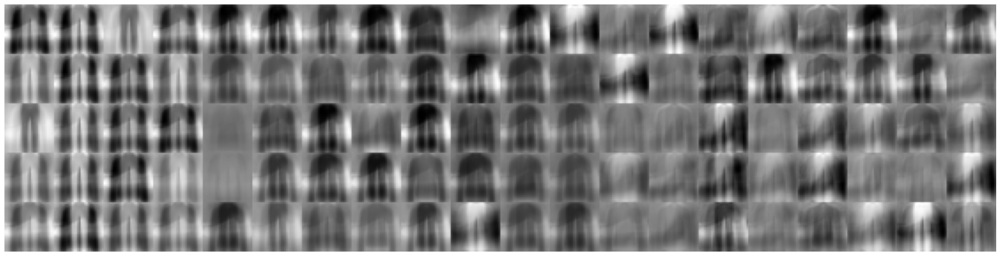

CNN-FASHION+L1REG, is_unpruned=True


submodule layers: [0, 1, 1, 1, 2]
submodule sizes: [7, 6, 11, 4, 5]


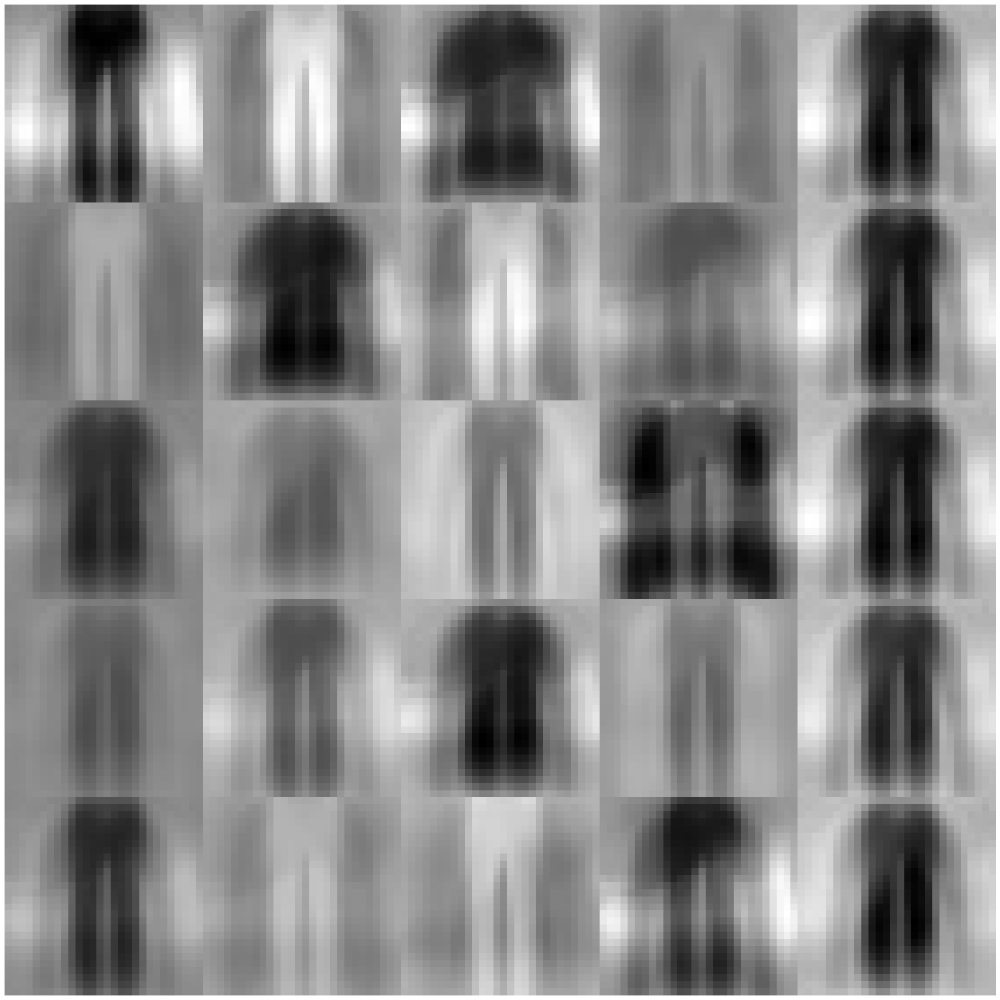


CNN-FASHION+L1REG, is_unpruned=False
submodule layers: [0, 1, 2]
submodule sizes: [10, 6, 4]


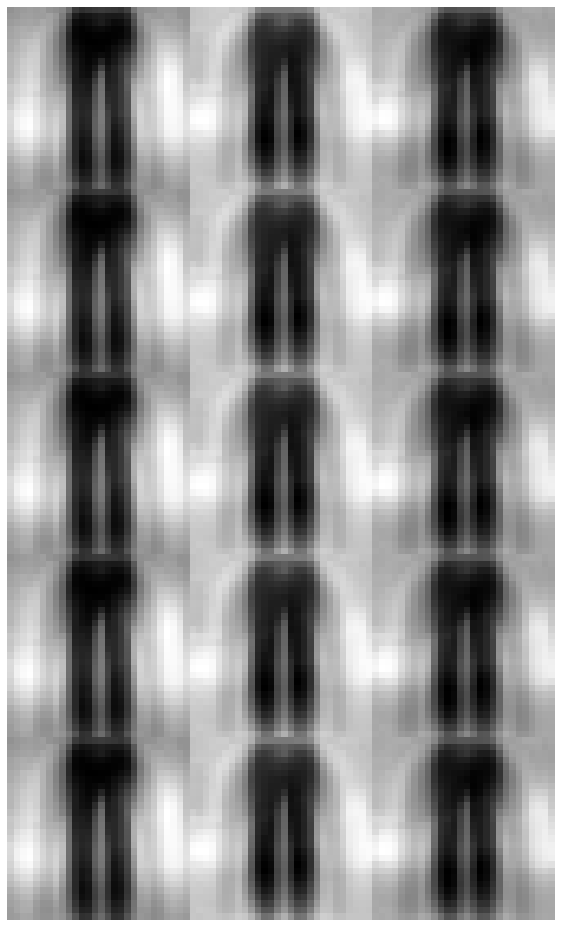

CNN-CIFAR10+DROPOUT, is_unpruned=True
submodule layers: [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2]
submodule sizes: [6, 10, 7, 4, 4, 4, 5, 7, 8, 6, 10, 4, 6, 5, 8, 5, 11, 9, 7, 13]


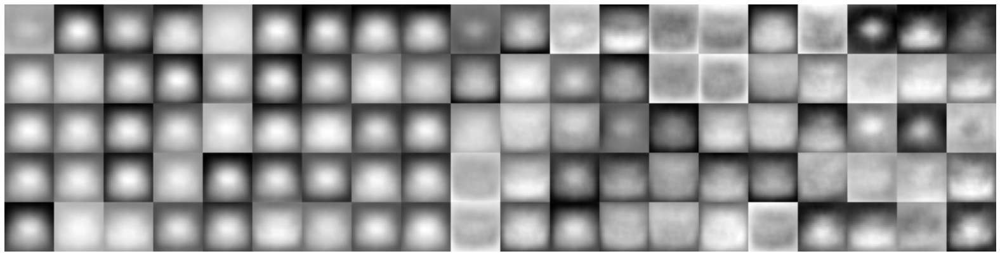


CNN-CIFAR10+DROPOUT, is_unpruned=False
submodule layers: [0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2]
submodule sizes: [6, 7, 9, 7, 12, 11, 5, 11, 4, 16, 10, 6, 17]


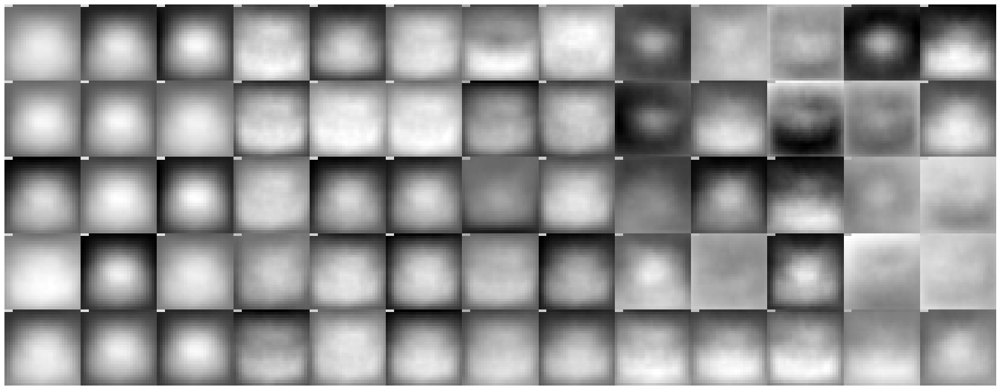

CNN-CIFAR10+L1REG, is_unpruned=True
submodule layers: [0, 1, 2]
submodule sizes: [8, 8, 4]


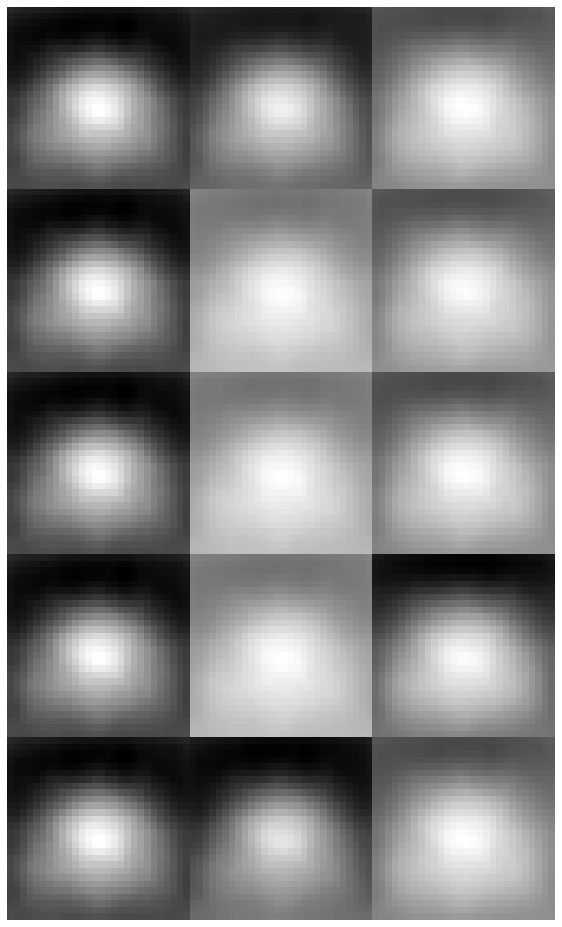


CNN-CIFAR10+L1REG, is_unpruned=False
submodule layers: [0, 1, 2]
submodule sizes: [8, 8, 4]


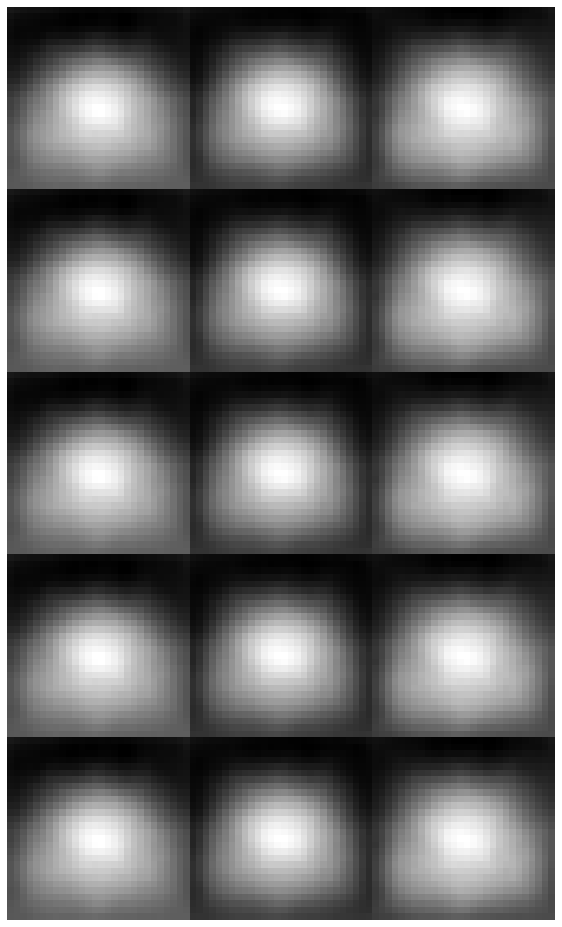

In [2]:
model_tags = ['MNIST+DROPOUT', 'HALVES-MNIST+DROPOUT',
              'HALVES-SAME-MNIST+DROPOUT',
              'FASHION+DROPOUT', 'CIFAR10+DROPOUT',
              'CNN-MNIST+DROPOUT', 'CNN-STACKED-SAME-MNIST+DROPOUT',
              'CNN-STACKED-MNIST+DROPOUT',
              'CNN-FASHION+DROPOUT', 'CNN-CIFAR10+DROPOUT']

with warnings.catch_warnings():
    warnings.simplefilter('ignore')

    for model_tag in model_tags:

        model_path = get_model_path(model_tag)

        vis_results = cluster_and_visualize(model_path, model_path, n_clusters=10, filter_norm=1)

        for is_unpruned in [True, False]:

            all_columns = []
            all_layers = []
            all_sizes = []

            for lyr_i, lyr in enumerate(vis_results[is_unpruned]):
                for clust in vis_results[is_unpruned][lyr]:

                    ims = vis_results[is_unpruned][lyr][clust]['ims']
                    size = vis_results[is_unpruned][lyr][clust]['size']

                    if len(ims[0].shape) > 2:
                        ims = [np.hstack([vis[i] for i in range(len(vis))]) for vis in ims]
                    all_vis = np.vstack(ims)
                    all_vis -= np.min(all_vis)  # normalize to have values in in [0,1]
                    all_vis /= np.max(all_vis)  # normalize to have values in in [0,1]
                    if len(ims) > 1:
                        all_columns.append(all_vis)
                        all_columns.append(np.ones((all_vis.shape[0], 2)))
                        all_sizes.append(size)
                        all_layers.append(lyr_i)

            all_cols_vis = np.hstack(all_columns)

            print(f'{model_tag}, is_unpruned={is_unpruned}')
            print('submodule layers:', all_layers)
            print('submodule sizes:', all_sizes)
            plt.figure(figsize=(0.2*all_cols_vis.shape[0], 0.2*all_cols_vis.shape[1]))
            plt.axis('off')
            plt.imshow(all_cols_vis, cmap='gray')
            plt.show()
            print()